In [ ]:
# importing libraries
import numpy as np
import tensorflow as tf
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from pathlib import Path
import os.path
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import os
from sklearn.ensemble import RandomForestClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Dense,
                                     Flatten,
                                     Dropout,
                                     BatchNormalization,
                                     Conv2D,
                                     MaxPooling2D,)
from tensorflow.keras.regularizers import l2
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


**1. Dataset Loading and Dataframe Creataion**

**1.1 Function that Create Dataframe for  train,test and valid dataset with 2 column Filename and Label with shuffling data.**

In [ ]:
def proc_img(filepath):
    """ Create a DataFrame with the filepath and the labels of the pictures"""

    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepath))
    filepath = pd.Series(filepath, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')
    df = pd.concat([filepath, labels], axis=1)
    df = df.sample(frac=1).reset_index(drop = True)
    return df

**1.2 Importing train data from directory**

In [ ]:
train_dir=Path('/content/drive/MyDrive/train')
filepaths = list(train_dir.glob(r'**/*.jpg'))
df_train = proc_img(filepaths)


**sample train Dataframe**

In [ ]:
df_train.head(5)

,Filepath,Label
0,/content/drive/MyDrive/train/nowildfire/-123.1...,nowildfire
1,/content/drive/MyDrive/train/nowildfire/-114.0...,nowildfire
2,/content/drive/MyDrive/train/nowildfire/-79.61...,nowildfire
3,/content/drive/MyDrive/train/nowildfire/-114.0...,nowildfire
4,/content/drive/MyDrive/train/nowildfire/-123.0...,nowildfire


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**1.3 Importing validation data from directory**

In [ ]:
val_dir=Path('/content/drive/MyDrive/valid')
valfilepaths = list(val_dir.glob(r'**/*.jpg'))
df_valid = proc_img(valfilepaths)

**1.4 Importing Test data from directory**

In [ ]:
test_dir=Path('/content/drive/MyDrive/test')
testfilepaths = list(test_dir.glob(r'**/*.jpg'))
df_test = proc_img(testfilepaths)

In [ ]:
df_test.head(5)

,Filepath,Label
0,/content/drive/MyDrive/valid/wildfire/-69.8687...,wildfire
1,/content/drive/MyDrive/valid/wildfire/-78.7078...,wildfire
2,/content/drive/MyDrive/valid/wildfire/-71.9386...,wildfire
3,/content/drive/MyDrive/valid/wildfire/-74.1532...,wildfire
4,/content/drive/MyDrive/valid/wildfire/-71.1114...,wildfire


**1.4 Information about the image shape and channels**

In [ ]:
def print_df(df):

    print(f'Number of pictures: {df.shape[0]}\n')
    print(f'Number of different labels: {len(df.Label.unique())}\n')
    print(f'Labels: {df.Label.unique()}')
def printhead(df):
    print(df.head(5))
print("length of image is: ", plt.imread(df_test["Filepath"][0]).shape[0], "width is: ", plt.imread(df_test["Filepath"][0]).shape[1]," and number of channels are: ", plt.imread(df_test["Filepath"][0]).shape[2])

length of image is:  350 width is:  350  and number of channels are:  3


**1.5 Plot some wildfire and nowildfire images to get better understanding**

In [ ]:
def viz_img(df):
    df_1 = df.copy().reset_index()
    fig, axes = plt.subplots( nrows=2,ncols=3, figsize=(20, 10), subplot_kw={'xticks': [], 'yticks': []})
    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(df_1.Filepath[i]))
        ax.set_title(df_1.Label[i])
    plt.tight_layout(pad=0.5)
    plt.show()

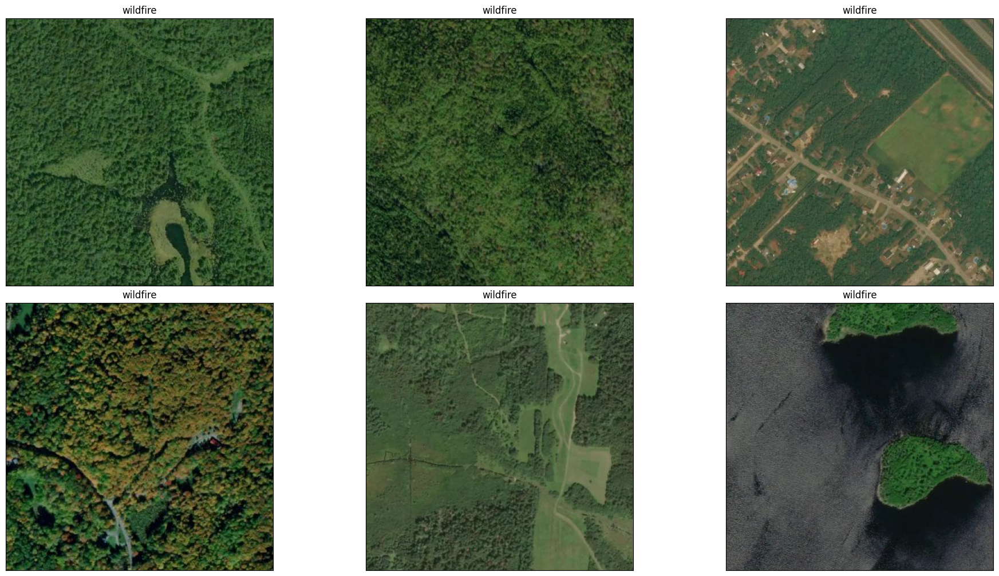

In [ ]:
df1=df_train.copy()
df1=df1[df1.Label=='wildfire']
viz_img(df1)

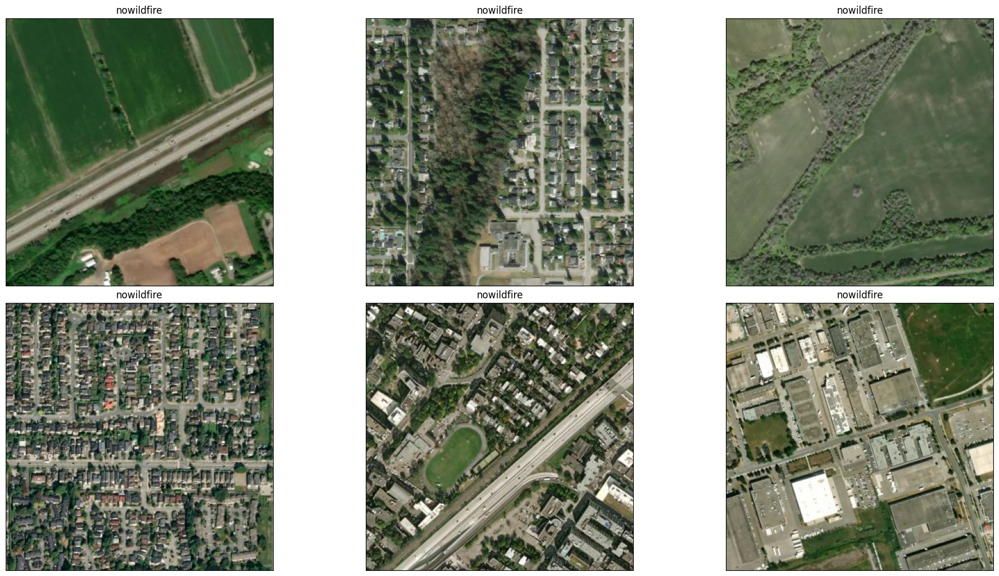

In [ ]:
df1=df_train.copy()
df1=df1[df1.Label=='nowildfire']
viz_img(df1)

# **2.Data Preprocessing**

### **2.1 Rename Labels for processing and fit into Image Datagen**

In [ ]:
def renaminglabel(dataframe):

# Iterate through rows in the DataFrame using iterrows()
   for index, row in dataframe.iterrows():
      if row['Label'] == 'wildfire':
       dataframe.at[index, 'Label'] = '1'
      else:
        dataframe.at[index, 'Label'] = '0'
   return dataframe;


In [ ]:
df_train=renaminglabel(df_train)

In [ ]:
df_valid=renaminglabel(df_valid)

In [ ]:
df_test=renaminglabel(df_test)

In [ ]:
df_test.head(5)

,Filepath,Label
0,/content/drive/MyDrive/valid/wildfire/-76.7518...,1
1,/content/drive/MyDrive/valid/nowildfire/-75.71...,0
2,/content/drive/MyDrive/valid/wildfire/-74.7431...,1
3,/content/drive/MyDrive/valid/wildfire/-75.8983...,1
4,/content/drive/MyDrive/valid/nowildfire/-122.9...,0


**2.2 Splitting labled and unlabeled data from df_train**

In [ ]:



# Split the DataFrame into two DataFrames (e.g., top 3 rows and the rest)
labeled_set = df_train.iloc[:500]  # First 1000 rows
unlabeled= df_train.iloc[28000:]  # Rows starting from the 28000th row onwards(2250)


**2.3 Combined dataframe for fully Supervised Learning(Labeled data only)**

In [ ]:
combined_df = pd.concat([labeled_set, unlabeled], axis=0)
combined_df=combined_df.reset_index(drop=True)

In [ ]:
combined_df.head(5)

,Filepath,Label
0,/content/drive/MyDrive/train/wildfire/-79.0127...,1
1,/content/drive/MyDrive/train/wildfire/-76.4011...,1
2,/content/drive/MyDrive/train/wildfire/-75.8203...,1
3,/content/drive/MyDrive/train/wildfire/-77.4465...,1
4,/content/drive/MyDrive/train/wildfire/-66.1740...,1


In [ ]:
labeled_set

,Filepath,Label
0,/content/drive/MyDrive/train/nowildfire/-114.1...,0
1,/content/drive/MyDrive/train/wildfire/-78.5672...,1
2,/content/drive/MyDrive/train/nowildfire/-75.67...,0
3,/content/drive/MyDrive/train/wildfire/-71.4668...,1
4,/content/drive/MyDrive/train/wildfire/-72.6318...,1
...,...,...
995,/content/drive/MyDrive/train/nowildfire/-113.9...,0
996,/content/drive/MyDrive/train/nowildfire/-75.66...,0
997,/content/drive/MyDrive/train/wildfire/-77.9825...,1
998,/content/drive/MyDrive/train/nowildfire/-75.67...,0


**2.4 Dropping label column from unlabel set for semi-supervised Learning**

In [ ]:
unlabeled_set= unlabeled.drop('Label', axis=1)
# Reset the index without dropping the old index column
unlabeled_set= unlabeled_set.reset_index(drop=True)

In [ ]:
unlabeled_set

,Filepath
0,/content/drive/MyDrive/train/nowildfire/-73.83...
1,/content/drive/MyDrive/train/nowildfire/-113.9...
2,/content/drive/MyDrive/train/nowildfire/-114.1...
3,/content/drive/MyDrive/train/wildfire/-64.9174...
4,/content/drive/MyDrive/train/wildfire/-79.1285...
...,...
3245,/content/drive/MyDrive/train/wildfire/-72.9696...
3246,/content/drive/MyDrive/train/nowildfire/-114.1...
3247,/content/drive/MyDrive/train/nowildfire/-114.0...
3248,/content/drive/MyDrive/train/nowildfire/-75.68...


In [ ]:
valid_set= df_valid[:1000]

In [ ]:
test_set= df_test.iloc[:1000]

**2.5 Creating Augmented Image of labeld, unlabeld, validation and test sets using Keras ImagedataGenerator**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def create_datagen(dataframe):
    # Create an ImageDataGenerator
    datagen = tf.keras.preprocessing.image.ImageDataGenerator(

        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input

    )
    data_generator = datagen.flow_from_dataframe(
        dataframe=dataframe,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=50,
        shuffle=False,
        seed=0,
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )



    return data_generator

# Example usage:




In [ ]:
label_dataset=create_datagen(labeled_set)
combined_dataset = create_datagen(combined_df)
validation_dataset = create_datagen(valid_set)



Found 500 validated image filenames belonging to 1 classes.
Found 2750 validated image filenames belonging to 1 classes.
Found 1000 validated image filenames belonging to 2 classes.


In [ ]:
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
    )
test_dataset = test_generator.flow_from_dataframe(
        dataframe=test_set,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=50,
        shuffle=False
    )

Found 958 validated image filenames belonging to 2 classes.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def create_datagen_for_unlabel(dataframe):
    # Create an ImageDataGenerator
    datagen = tf.keras.preprocessing.image.ImageDataGenerator(

        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input

    )
    data_generator = datagen.flow_from_dataframe(
        dataframe=dataframe,
        x_col='Filepath',

        target_size=(224, 224),
        color_mode='rgb',
        class_mode=None,
        batch_size=50,
        shuffle=False,
        seed=0,
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )



    return data_generator

# Example usage:




In [ ]:
unlabel_dataset=create_datagen_for_unlabel(unlabeled_set)

Found 2250 validated image filenames.


**3. Methodology**

**3.1 Create a CNN Model**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers

# Define the CNN model
def create_cnn_model(input_shape, num_classes):
    model = models.Sequential()

    # Input Layer
    model.add(layers.BatchNormalization(input_shape=input_shape))

    # Convolutional Layer 1
    model.add(layers.Conv2D(32, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=2))

    # Convolutional Layer 2
    model.add(layers.Conv2D(32, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=2))

    # Convolutional Layer 3
    model.add(layers.Conv2D(32, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=2))

    # BatchNormalization Layer
    model.add(layers.BatchNormalization())

    # Flatten Layer
    model.add(layers.Flatten())

    # Dropout Layer
    model.add(layers.Dropout(0.1))

    # Fully Connected Layer 1
    model.add(layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)))

    # Dropout Layer
    model.add(layers.Dropout(0.1))

    # Fully Connected Layer 2
    model.add(layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)))

    # Dropout Layer
    model.add(layers.Dropout(0.1))

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model








In [ ]:
input_shape=(224,224,3)
num_classes=2
cnn_model= create_cnn_model(input_shape, num_classes)

In [ ]:
cnn_model.compile(optimizer='adam',  # You can use other optimizers like 'sgd', 'rmsprop', etc.
              loss='categorical_crossentropy',  # Adjust the loss function based on your task
              metrics=['accuracy'])

**3.2 Training the model with fewer Labeled data**

In [ ]:
cnn_model.fit(label_dataset,
     validation_data=validation_dataset,
                    epochs=1)

16/16 [==============================] - 85s 5s/step - loss: 0.6395 - accuracy: 0.8500 - val_loss: 0.5855 - val_accuracy: 0.7550


 **3.3 Semi supervised Learning(Self-training Pseudo labeling) process to get pseudo-label for unlabeled data using cnn model**

In [ ]:
epoch = 1
threshold = 0.90
for epoch_idx in range( epoch ):

  print( "Epoch {}/{}".format( epoch_idx + 1, epoch ) )
  for i in range(30):
    unlabeled_predictions =cnn_model.predict((unlabel_dataset))
    pseudo_labels = np.array( [ np.argmax(x) if np.max(x) > threshold else -1 for x in unlabeled_predictions])
    indices = np.where(pseudo_labels != -1)[0]
    if(len(indices)<=0):
      break;
    high_confidence_unlabeled_data = unlabeled_set.iloc[indices]
    high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
    high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)
    labeled_set= pd.concat([labeled_set, high_confidence_unlabeled_data], axis=0, ignore_index=True)
    unlabeled_set =  unlabeled_set.drop(indices)
    unlabeled_set= unlabeled_set.reset_index(drop=True)
    if(len(unlabeled_set)<=0):
      break;

    unlabel_dataset =create_datagen_for_unlabel(unlabeled_set)

    labeled_images = create_datagen(labeled_set)

    training_history=cnn_model.fit(labeled_images)
  validation_history=cnn_model.evaluate(validation_dataset)







Epoch 1/1
40/40 [==============================] - 30s 717ms/step


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1231 validated image filenames.
Found 519 validated image filenames belonging to 2 classes.
39/39 [==============================] - 29s 739ms/step
Found 988 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 762 validated image filenames belonging to 2 classes.
31/31 [==============================] - 21s 686ms/step
Found 893 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 857 validated image filenames belonging to 2 classes.
28/28 [==============================] - 20s 697ms/step
Found 875 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 875 validated image filenames belonging to 2 classes.
28/28 [==============================] - 19s 690ms/step
Found 866 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 884 validated image filenames belonging to 2 classes.
28/28 [==============================] - 22s 781ms/step
Found 857 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 893 validated image filenames belonging to 2 classes.
27/27 [==============================] - 19s 712ms/step
Found 768 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 982 validated image filenames belonging to 2 classes.
24/24 [==============================] - 17s 721ms/step
Found 176 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1574 validated image filenames belonging to 2 classes.
6/6 [==============================] - 4s 619ms/step
Found 102 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1648 validated image filenames belonging to 2 classes.
4/4 [==============================] - 2s 362ms/step
Found 100 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1650 validated image filenames belonging to 2 classes.
4/4 [==============================] - 3s 593ms/step
Found 76 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1674 validated image filenames belonging to 2 classes.
3/3 [==============================] - 1s 340ms/step
Found 66 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1684 validated image filenames belonging to 2 classes.
3/3 [==============================] - 2s 513ms/step
Found 56 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1694 validated image filenames belonging to 2 classes.
2/2 [==============================] - 1s 374ms/step
Found 51 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1699 validated image filenames belonging to 2 classes.
2/2 [==============================] - 2s 455ms/step
Found 32 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1718 validated image filenames belonging to 2 classes.
1/1 [==============================] - 1s 662ms/step
Found 22 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1728 validated image filenames belonging to 2 classes.
1/1 [==============================] - 1s 750ms/step
Found 15 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1735 validated image filenames belonging to 2 classes.
1/1 [==============================] - 0s 491ms/step
Found 11 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1739 validated image filenames belonging to 2 classes.
1/1 [==============================] - 0s 419ms/step
Found 7 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1743 validated image filenames belonging to 2 classes.
1/1 [==============================] - 0s 284ms/step
Found 6 validated image filenames.


<ipython-input-94-948a55158cbf>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-94-948a55158cbf>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 1744 validated image filenames belonging to 2 classes.
32/32 [==============================] - 24s 749ms/step - loss: 0.7151 - accuracy: 0.8050


 **3.4 Get Accuarcy on Test Data**

In [ ]:
predictions=cnn_model.predict(test_dataset)

32/32 [==============================] - 24s 749ms/step


In [ ]:
predicted_classes = np.argmax(predictions, axis=1)
actual_labels=test_set.Label

correct_predictions = np.sum(predicted_classes.astype(str) == actual_labels)
total_predictions = len(actual_labels)
semi_supervised_accuracy_cnn = correct_predictions / total_predictions
print("Semi Supervised accuracy : {:.2f}%".format(semi_supervised_accuracy_cnn * 100))

Semi Supervised accuracy : 77.80%


#                                                       Semi Supervised accuracy :  77.80%

**3.5 Plotting Actual and predicted Label for self-training process with CNN model**

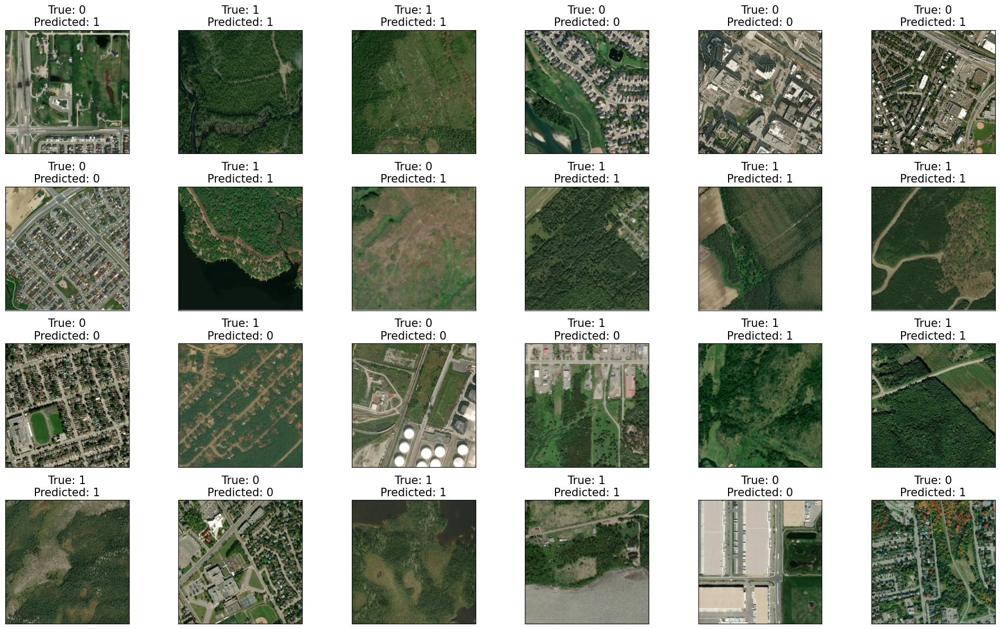

In [ ]:


fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_set.Filepath.iloc[i]))
    ax.set_title(f"True: {test_set.Label.iloc[i]}\nPredicted: {predicted_classes[i]}", fontsize = 15)
plt.tight_layout()
plt.show()

**3.6 Supervised Training with CNN model**

In [ ]:
history=cnn_model.fit(combined_dataset,
     validation_data=validation_dataset,
                    epochs=1)

55/55 [==============================] - 173s 3s/step - loss: 0.4518 - accuracy: 0.8554 - val_loss: 0.6783 - val_accuracy: 0.5800


In [ ]:
predictions=cnn_model.predict(test_dataset)

32/32 [==============================] - 24s 738ms/step


In [ ]:
predicted_classes = np.argmax(predictions, axis=1)
actual_labels=test_set.Label

correct_predictions = np.sum(predicted_classes.astype(str) == actual_labels)
total_predictions = len(actual_labels)
supervised_accuracy_cnn_model = correct_predictions / total_predictions
print(" Supervised accuracy : {:.2f}%".format(supervised_accuracy_cnn_model* 100))

 Supervised accuracy : 62.40%


# Supervised accuracy : 62.40%

**Plotting Accuracy Comparison**

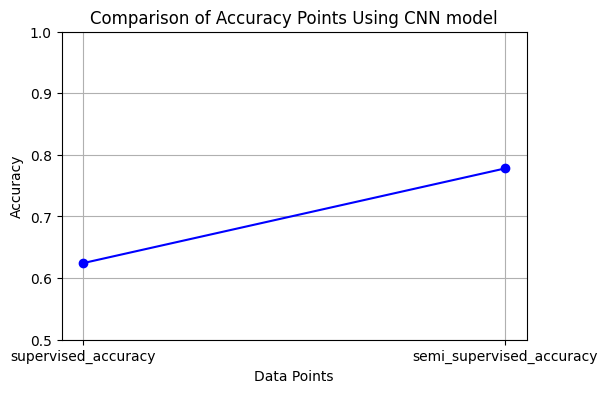

In [ ]:
import matplotlib.pyplot as plt

# Accuracy values
accuracies = [supervised_accuracy_cnn_model, semi_supervised_accuracy_cnn]
labels = ['supervised_accuracy', 'semi_supervised_accuracy']

# Create a bar plot
plt.figure(figsize=(6, 4))
plt.plot(labels, accuracies, marker='o', linestyle='-', color='blue')
plt.ylim(0.5, 1.0)  # Set the y-axis limit for better visualization
plt.xlabel('Data Points')
plt.ylabel('Accuracy')
plt.title('Comparison of Accuracy Points Using CNN model')
plt.grid(True)
plt.show()

 **Now We will explore other model as CNN model is not giving good accuracy**

 **3.7 Creating The REsnet50 Model**

In [ ]:

def get_model(model):
    kwargs =    {'input_shape':(224, 224, 3),
                'include_top':False,
                'weights':'imagenet',
                'pooling':'avg'}


    pretrained_model = model(**kwargs)
    pretrained_model.trainable = False

    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    outputs = tf.keras.layers.Dense(2, activation='softmax')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


In [ ]:
resnet_model = get_model(tf.keras.applications.ResNet50V2)

 Before Performing Self-training process, size of labeled and unlabeled data

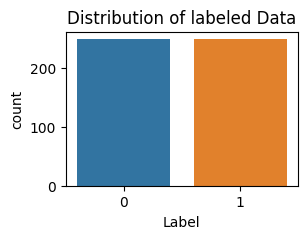

In [ ]:
# Plot the distribution of unlabeled data
plt.figure(figsize=(3, 2))
sns.countplot(x='Label', data=labeled_set)
plt.title('Distribution of labeled Data')
plt.show()


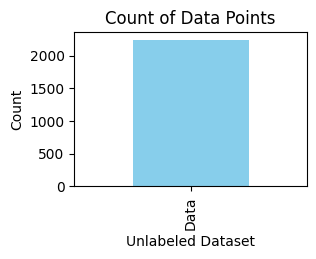

In [ ]:
import matplotlib.pyplot as plt

# Assuming unlabeled_set is your DataFrame with the "Filepath" column
plt.figure(figsize=(3, 2))
unlabeled_set['Filepath'].apply(lambda x: 'Data' if pd.notna(x) else 'Missing').value_counts().plot(kind='bar', color='skyblue')
plt.title('Count of Data Points')
plt.xlabel('Unlabeled Dataset')
plt.ylabel('Count')
plt.show()


**3.8 Train the model with labeled data**

In [ ]:
resnet_model = get_model(tf.keras.applications.ResNet50V2)

In [ ]:
resnet_model.fit(label_dataset,
     validation_data=validation_dataset,
                    epochs=1,
                    callbacks=[
                        tf.keras.callbacks.EarlyStopping(
                            monitor='val_loss',
                            patience=1,
                            restore_best_weights=True)]
                    )

10/10 [==============================] - 393s 41s/step - loss: 0.3204 - accuracy: 0.8760 - val_loss: 0.1905 - val_accuracy: 0.9370


**3.9 Semi supervised Learning(Self-training Pseudo labeling) process to get pseudo-label for unlabeled data** **using REsnet50 model**

In [ ]:
epoch = 1
threshold = 0.90
accuracy_list=[]
loss_list=[]

for epoch_idx in range( epoch ):

  print( "Epoch {}/{}".format( epoch_idx + 1, epoch ) )
  for i in range(30):

    unlabeled_predictions =resnet_model.predict((unlabel_dataset)) #Prediction gon Unlabeled data
    pseudo_labels = np.array( [ np.argmax(x) if np.max(x) > threshold else -1 for x in unlabeled_predictions]) # checeking if the probability is greater than Threshold
    indices = np.where(pseudo_labels != -1)[0]  #Filtering the Confident indices
    if(len(indices)<=0):
      break;


    high_confidence_unlabeled_data = unlabeled_set.iloc[indices] # Retrieveing data from Unlabeled set that are confident
    high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
    high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)

    labeled_set= pd.concat([labeled_set, high_confidence_unlabeled_data], axis=0, ignore_index=True) #adding them to labeled dataframe

    unlabeled_set =  unlabeled_set.drop(indices) # deleteing confident data from unlabeled dataframe
    unlabeled_set= unlabeled_set.reset_index(drop=True)
    if(len(unlabeled_set)<=0):
      break;

    unlabel_dataset =create_datagen_for_unlabel(unlabeled_set)

    labeled_images = create_datagen(labeled_set)

    training_loss_accuracy=resnet_model.fit(labeled_images)  #training with additional data
    accuracy_list.append(training_loss_accuracy.history['accuracy'])
    loss_list.append(training_loss_accuracy.history['loss'])
  validation_loss_accuracy=resnet_model.evaluate(validation_dataset)









Epoch 1/1
45/45 [==============================] - 604s 13s/step
Found 558 validated image filenames.


<ipython-input-96-2b438933be32>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-96-2b438933be32>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 2192 validated image filenames belonging to 2 classes.
12/12 [==============================] - 89s 7s/step
Found 162 validated image filenames.


<ipython-input-96-2b438933be32>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-96-2b438933be32>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 2588 validated image filenames belonging to 2 classes.
4/4 [==============================] - 27s 6s/step
Found 27 validated image filenames.


<ipython-input-96-2b438933be32>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-96-2b438933be32>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 2723 validated image filenames belonging to 2 classes.
1/1 [==============================] - 4s 4s/step
Found 4 validated image filenames.


<ipython-input-96-2b438933be32>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-96-2b438933be32>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 2746 validated image filenames belonging to 2 classes.
1/1 [==============================] - 1s 887ms/step
Found 3 validated image filenames.


<ipython-input-96-2b438933be32>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-96-2b438933be32>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 2747 validated image filenames belonging to 2 classes.
20/20 [==============================] - 158s 8s/step - loss: 0.2050 - accuracy: 0.9570


 **After performing self-training(converging) size of labeled and unlabeled dataset are provided below:**

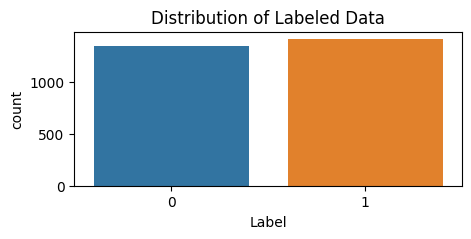

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of labeled data
plt.figure(figsize=(5, 2))
sns.countplot(x='Label', data=labeled_set)
plt.title('Distribution of Labeled Data')
plt.show()


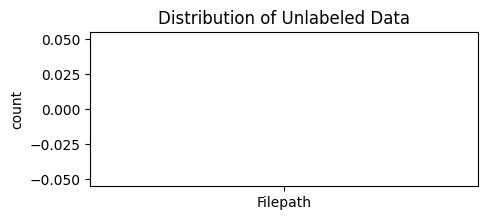

In [ ]:
# Plot the distribution of unlabeled data
plt.figure(figsize=(5, 2))
sns.countplot( data=unlabeled_set)
plt.title('Distribution of Unlabeled Data')
plt.show()


 **3.10 Getting Accuracy on Test Data**

In [ ]:
predictions=resnet_model.predict(test_dataset)

20/20 [==============================] - 208s 11s/step


In [ ]:
predicted_classes = np.argmax(predictions, axis=1)
actual_labels=test_set.Label

correct_predictions = np.sum(predicted_classes.astype(str) == actual_labels)
total_predictions = len(actual_labels)
semi_supervised_accuracy_resnet_model = correct_predictions / total_predictions
print("Semi Supervised accuracy : {:.2f}%".format(semi_supervised_accuracy_resnet_model * 100))

Semi Supervised accuracy : 95.00%


# Semi Supervised accuracy : 95.00%

**3.11 Plotting actal and predicted label for the images using self_traing with resnet-50**

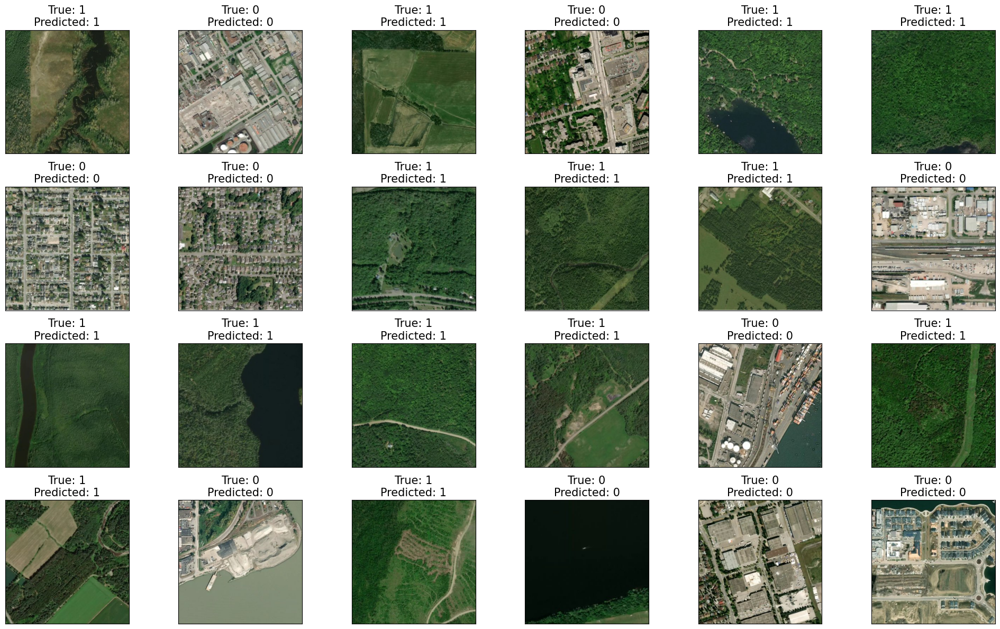

In [ ]:


fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_set.Filepath.iloc[i]))
    ax.set_title(f"True: {test_set.Label.iloc[i]}\nPredicted: {predicted_classes[i]}", fontsize = 15)
plt.tight_layout()
plt.show()

 **3.13 Supervised Learning using REsnet50 model**

In [ ]:
resnet_model = get_model(tf.keras.applications.ResNet50V2)

In [ ]:
history=resnet_model.fit(combined_dataset,
     validation_data=validation_dataset,
                    epochs=1,
                    callbacks=[
                        tf.keras.callbacks.EarlyStopping(
                            monitor='val_loss',
                            patience=1,
                            restore_best_weights=True)]
                    )


55/55 [==============================] - 641s 12s/step - loss: 0.2037 - accuracy: 0.9244 - val_loss: 0.1253 - val_accuracy: 0.9580


In [ ]:
Supervised_predictions=resnet_model.predict(test_dataset)
Supervised_predicted_classes = np.argmax(Supervised_predictions, axis=1)
actual_labels=test_set.Label

correct_predictions = np.sum(Supervised_predicted_classes.astype(str) == actual_labels)
total_predictions = len(actual_labels)
supervised_accuracy_resnet_model = correct_predictions / total_predictions
print(" Supervised accuracy : {:.2f}%".format(supervised_accuracy_resnet_model * 100))

20/20 [==============================] - 161s 8s/step
 Supervised accuracy : 94.90%


# Supervised accuracy : 94.90%

# Semi Supervised Accuracy : 95.00% and
# Supervised Accuracy 94.90%   for ResNet-50

**3.15 Plotting the Comaprison Of accuracy points  for Resnet-50 model**

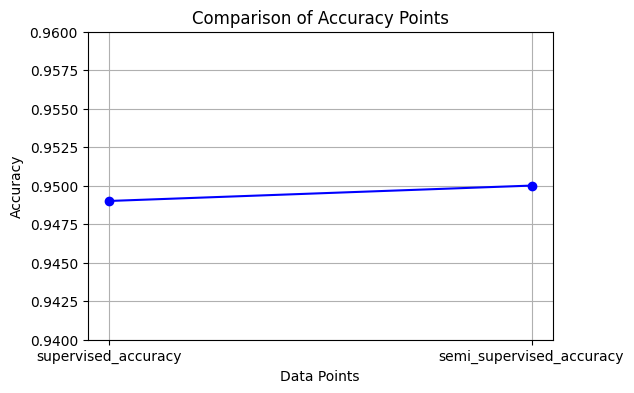

In [ ]:
import matplotlib.pyplot as plt

# Accuracy values
accuracies = [supervised_accuracy_resnet_model, semi_supervised_accuracy_resnet_model]
labels = ['supervised_accuracy', 'semi_supervised_accuracy']

# Create a bar plot
plt.figure(figsize=(6, 4))
plt.plot(labels, accuracies, marker='o', linestyle='-', color='blue')
plt.ylim(0.94, 0.96)  # Set the y-axis limit for better visualization
plt.xlabel('Data Points')
plt.ylabel('Accuracy')
plt.title('Comparison of Accuracy Points')
plt.grid(True)
plt.show()

**3.16 Additional Experiment For increased Labeled data from 500 to  1000 and Unlabeled data 2250**

In [ ]:

# Split the DataFrame into two DataFrames (e.g., top 3 rows and the rest)
labeled_set = df_train.iloc[:1000]  # First 1000 rows
 # Rows starting from the 28000th row onwards

In [ ]:
label_dataset=create_datagen(labeled_set)
combined_dataset = create_datagen(combined_df)
test_dataset = create_datagen(test_set)
validation_dataset = create_datagen(valid_set)

Found 1000 validated image filenames belonging to 2 classes.
Found 3250 validated image filenames belonging to 2 classes.
Found 1000 validated image filenames belonging to 2 classes.
Found 1000 validated image filenames belonging to 2 classes.


In [ ]:
resnet_model=training_with_labeled_data(label_dataset,validation_dataset)

20/20 [==============================] - 579s 29s/step - loss: 0.2655 - accuracy: 0.8990 - val_loss: 0.2108 - val_accuracy: 0.9140


In [ ]:
epoch = 1
threshold = 0.90

for epoch_idx in range( epoch ):

  print( "Epoch {}/{}".format( epoch_idx + 1, epoch ) )
  for i in range(30):

    unlabeled_predictions =resnet_model.predict((unlabel_dataset)) #Prediction gon Unlabeled data
    pseudo_labels = np.array( [ np.argmax(x) if np.max(x) > threshold else -1 for x in unlabeled_predictions]) # checeking if the probability is greater than Threshold
    indices = np.where(pseudo_labels != -1)[0]  #Filtering the Confident indices
    if(len(indices)<=0):
      break;


    high_confidence_unlabeled_data = unlabeled_set.iloc[indices] # Retrieveing data from Unlabeled set that are confident
    high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
    high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)

    labeled_set= pd.concat([labeled_set, high_confidence_unlabeled_data], axis=0, ignore_index=True) #adding them to labeled dataframe

    unlabeled_set =  unlabeled_set.drop(indices) # deleteing confident data from unlabeled dataframe
    unlabeled_set= unlabeled_set.reset_index(drop=True)
    if(len(unlabeled_set)<=0):
      break;
    print(" Reduced Number of Unlabeled data  ")

    unlabel_dataset =create_datagen_for_unlabel(unlabeled_set)

    labeled_images = create_datagen(labeled_set)
    print("Incresesd Number of labeled data  ")

    training_loss_accuracy=resnet_model.fit(labeled_images)  #training with additional data
  validation_loss_accuracy=.evaluate(validation_dataset)









Epoch 1/1
45/45 [==============================] - 540s 12s/step
 Reduced Number of Unlabeled data  
Found 556 validated image filenames.


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Incresesd Number of labeled data  
Found 2694 validated image filenames belonging to 2 classes.
12/12 [==============================] - 110s 9s/step
 Reduced Number of Unlabeled data  
Found 218 validated image filenames.


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Incresesd Number of labeled data  
Found 3032 validated image filenames belonging to 2 classes.
5/5 [==============================] - 40s 7s/step
 Reduced Number of Unlabeled data  
Found 143 validated image filenames.
Incresesd Number of labeled data  


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 3107 validated image filenames belonging to 2 classes.
3/3 [==============================] - 29s 9s/step
 Reduced Number of Unlabeled data  
Found 35 validated image filenames.


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Incresesd Number of labeled data  
Found 3215 validated image filenames belonging to 2 classes.
1/1 [==============================] - 6s 6s/step
 Reduced Number of Unlabeled data  
Found 19 validated image filenames.
Incresesd Number of labeled data  


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 3231 validated image filenames belonging to 2 classes.
1/1 [==============================] - 3s 3s/step
 Reduced Number of Unlabeled data  
Found 8 validated image filenames.


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Incresesd Number of labeled data  
Found 3242 validated image filenames belonging to 2 classes.
1/1 [==============================] - 1s 1s/step
 Reduced Number of Unlabeled data  
Found 6 validated image filenames.
Incresesd Number of labeled data  


<ipython-input-26-31d3e9c9cc09>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = pseudo_labels[indices]
<ipython-input-26-31d3e9c9cc09>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_confidence_unlabeled_data['Label'] = high_confidence_unlabeled_data['Label'].astype(str)


Found 3244 validated image filenames belonging to 2 classes.
20/20 [==============================] - 190s 9s/step - loss: 0.3068 - accuracy: 0.9290


In [ ]:
predictions=resnet_model.predict(test_dataset)
predicted_classes = np.argmax(predictions, axis=1)
actual_labels=test_set.Label

correct_predictions = np.sum(predicted_classes.astype(str) == actual_labels)
total_predictions = len(actual_labels)
accuracy = correct_predictions / total_predictions
print(" accuracy : {:.2f}%".format(accuracy * 100))

20/20 [==============================] - 238s 12s/step
 accuracy : 94.90%


**Accuracy didn't improve for the increasing labeled data from 500 to 1000**